### TECHNICAL REPORT - ANALYSING MOVIE GENRE PREDICTION

### Binary Classification with Natural Language Processing

### Problem Statement


<b>How can we classify a movie genre based on the subreddit posts using strongly asssociated words?</b>

Rotten Tomatoes and the Tomatometer score are the world’s most trusted recommendation resources for quality entertainment. It is one the leading online aggregator of movie and TV show reviews from critics and audience.

However, one of the current limitation with the movie database is that categorization into movie genres is still a manual process performed by our highly-esteemed curators. As this process is manual, it can lead to inaccurate classification of a movie into specific genre and has been challenged numerous times by our fans. This is because each person may have an opinion on what is the most suitable genre a movie belongs in.

Thus, instead of depending on any one person's opinion on a movie genre, we intend to leverage on natural language processing algorithms to determine the most suitable movie genre.This is a binary classification problem and a model can be build using natural language processing to predict the movie genre . As such, an exploratory team has been tasked to start on a pilot model that focuses on simply 2 genres: science fiction and horror as the variable to classify upon given a paragraph of words.

Why is genre classification is important ?
- Genre is imp for recommendation of a movie
- Without the characterizations viewers face an overwhelming number of choices
- Prediction of a genre can help user to discover other similar movies of the same ilk
- Better user experience
- Potential revisits to increase user engagement and revenue for business


## Executive Summary


For this project, we will consider the 2 classes: Sci-Fi and Horror movies.
Following sub-reddits are used to classify the movies:

- <a href="https://www.reddit.com/r/scifimovies/">r/scifimovies</a>
- <a href="https://www.reddit.com/r/HorrorMovies/">r/HorrorMovies</a>





After scraping, we will look at the most common words for each category - scifi and horror movies. After which, we will run a few models to consider if raw, pre-processed or lemmatization will yield the highest score. Once we can determine the type of data, we will run a grid search on the parameters that will give the best results.



### Libraries

In [636]:
import requests
import matplotlib
import nltk
from itertools import combinations
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import regex as re
import numpy as np

from IPython.display import display, Markdown
from bs4 import BeautifulSoup
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction import stop_words, text
#from matplotlib.colors import LinearSegmentedColormap
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, HashingVectorizer
from sklearn.linear_model import LogisticRegressionCV,LogisticRegression
from sklearn.naive_bayes import MultinomialNB, BernoulliNB, GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
from csv import reader
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
colors = ['#37535e', '#3b748a', '#4095b5', '#52aec9', '#72bfc4', '#93d0bf']

In [638]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', -1)


## Data Collection


The Data is scraped from the subreddits r/Horrormovies and r/scifimovies and is stored in the form a csv file in data folder.

Data Collection Code: <b>/data/P3_Data_Collection_01.ipynb</b>

In [639]:

df_horror=pd.read_csv('./data/horrormovies_2_20200625_131436.csv')
df_scifi=pd.read_csv('./data/scifimovies_2_20200625_131211.csv')

In [640]:
df_horror.shape #Data before deleting duplicate rows

(997, 110)

In [641]:
df_scifi.shape #Data before deleting duplicate rows

(904, 111)

### Data Cleaning and EDA


In [642]:
df_horror.head()

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,subreddit_name_prefixed,hidden,pwls,link_flair_css_class,downs,thumbnail_height,top_awarded_type,hide_score,name,quarantine,link_flair_text_color,upvote_ratio,author_flair_background_color,subreddit_type,ups,total_awards_received,media_embed,thumbnail_width,author_flair_template_id,is_original_content,user_reports,secure_media,is_reddit_media_domain,is_meta,category,secure_media_embed,link_flair_text,can_mod_post,score,approved_by,author_premium,thumbnail,edited,author_flair_css_class,author_flair_richtext,gildings,content_categories,is_self,mod_note,created,link_flair_type,wls,removed_by_category,banned_by,author_flair_type,domain,allow_live_comments,selftext_html,likes,suggested_sort,banned_at_utc,view_count,archived,no_follow,is_crosspostable,pinned,over_18,all_awardings,awarders,media_only,can_gild,spoiler,locked,author_flair_text,treatment_tags,visited,removed_by,num_reports,distinguished,subreddit_id,mod_reason_by,removal_reason,link_flair_background_color,id,is_robot_indexable,report_reasons,author,discussion_type,num_comments,send_replies,whitelist_status,contest_mode,mod_reports,author_patreon_flair,author_flair_text_color,permalink,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,post_hint,url_overridden_by_dest,preview,crosspost_parent_list,crosspost_parent,author_cakeday
0,NaN,HorrorMovies,"1. No promotion spamming. This includes YouTube links intended to draw traffic to your YouTube channel or accumulate views for yourself. Also included in this is links to blogs, groups or websites. Links to Wikipedia or IMDB in discussions are the exception to the rule.\n\n2. This sub is dedicated to discussions based around horror movies, as the name suggests. Discussion of horror related TV shows is usually OK, as long as it's of the horror or Thriller/SciFi genre, since the line between the two is so thin. (2.5) Spoiler warnings are implied in discussions, so if you don't want the movie spoiled, stay out of discussion posts.\n\n3. Don't post random spoopy stories or creepypasta. Just don't do it.\n\n4. If you have a link to share that's relevant and not spammy self promotion, message the mods first for approval. Don't post links without approval in threads or comments. \n\n5. Keep it nice and don't be a dick to each other.\n\n6. I suck at CSS, so if anyone can do better with the style sheet or wants to contribute to it, let me know.\n\n7. Images that are directly uploaded are iffy. We will mostly allow it if it isn't too shitposty. This is up to mods discretion. Don't like it? Go shitpost on /r/horror instead.\n\nOverall, don't spam stupid shit and be nice. Unapproved non discussion links will be removed and the poster risks being banned. It takes maybe 30 seconds to read the rules, and we moderate closely.\n\nDiscussion posts must not link to any outside source, IMDB and Wikipedia are mostly ok, unless they're being used as a means to grief people or self promote.\n\nAlso check out /r/Goremovies, ran by our very own frequent user Gorefilth. He posts a lot of cool splatter and obscure stuff on his sub. \n\nIf you have any suggestions on improvements that can be made, let me know.\n\nThanks for reading. I'm happy to have you here.",t2_3o8fm,False,NaN,0,False,Official Rules.,[],r/HorrorMovies,False,NaN,NaN,0,NaN,NaN,False,t3_74c5q1,False,dark,1.00,NaN,public,3,0,{},NaN,NaN,False,[],NaN,False,False,NaN,{},NaN,False,3,NaN,False,self,1591198134.0,NaN,[],{},NaN,True,NaN,1.507189e+09,text,NaN,NaN,NaN,text,self.HorrorMovies,True,"&lt;!-- SC_OFF --&gt;&lt;div class=""md""&gt;&lt;ol&gt;\n&lt;li&gt;&lt;p&gt;No promotion spamming. This includes YouTube links intended to draw traffic to your YouTube channel or accumulate views for yourself. Also included in this is links to blogs, groups or websites. Links to Wikipedia or IMDB in discussions are the exception to the rule.&l

In [643]:
df_scifi.head()

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,subreddit_name_prefixed,hidden,pwls,link_flair_css_class,downs,thumbnail_height,top_awarded_type,hide_score,name,quarantine,link_flair_text_color,upvote_ratio,author_flair_background_color,subreddit_type,ups,total_awards_received,media_embed,thumbnail_width,author_flair_template_id,is_original_content,user_reports,secure_media,is_reddit_media_domain,is_meta,category,secure_media_embed,link_flair_text,can_mod_post,score,approved_by,author_premium,thumbnail,edited,author_flair_css_class,author_flair_richtext,gildings,post_hint,content_categories,is_self,mod_note,created,link_flair_type,wls,removed_by_category,banned_by,author_flair_type,domain,allow_live_comments,selftext_html,likes,suggested_sort,banned_at_utc,url_overridden_by_dest,view_count,archived,no_follow,is_crosspostable,pinned,over_18,preview,all_awardings,awarders,media_only,can_gild,spoiler,locked,author_flair_text,treatment_tags,visited,removed_by,num_reports,distinguished,subreddit_id,mod_reason_by,removal_reason,link_flair_background_color,id,is_robot_indexable,report_reasons,author,discussion_type,num_comments,send_replies,whitelist_status,contest_mode,mod_reports,author_patreon_flair,author_flair_text_color,permalink,parent_whitelist_status,stickied,url,subreddit_subscribers,created_utc,num_crossposts,media,is_video,crosspost_parent_list,crosspost_parent,author_cakeday,media_metadata
0,NaN,scifimovies,NaN,t2_5s3h6rkp,False,NaN,0,False,"How To Make A Monster 1958 movie trailer Plot: When a master monster make-up artist is sacked by the new bosses of American International studios, he uses his creations to exact revenge.",[],r/scifimovies,False,NaN,NaN,0,105.0,NaN,False,t3_heysxo,False,dark,1.00,NaN,public,1,0,"{'content': '&lt;iframe width=""600"" height=""338"" src=""https://www.youtube.com/embed/VqapaOoYdC4?feature=oembed&amp;enablejsapi=1"" frameborder=""0"" allow=""accelerometer; autoplay; encrypted-media; gyroscope; picture-in-picture"" allowfullscreen&gt;&lt;/iframe&gt;', 'width': 600, 'scrolling': False, 'height': 338}",140.0,NaN,False,[],"{'type': 'youtube.com', 'oembed': {'provider_url': 'https://www.youtube.com/', 'version': '1.0', 'title': 'How To Make A Monster 1958 movie trailer', 'type': 'video', 'thumbnail_width': 480, 'height': 338, 'width': 600, 'html': '&lt;iframe width=""600"" height=""338"" src=""https://www.youtube.com/embed/VqapaOoYdC4?feature=oembed&amp;enablejsapi=1"" frameborder=""0"" allow=""accelerometer; autoplay; encrypted-media; gyroscope; picture-in-picture"" allowfullscreen&gt;&lt;/iframe&gt;', 'author_name': 'horrortheatervideo', 'provider_name': 'YouTube', 'thumbnail_url': 'https://i.ytimg.com/vi/VqapaOoYdC4/hqdefault.jpg', 'thumbnail_height': 360, 'author_url': 'https://www.youtube.com/user/horrortheatervideo'}}",False,False,NaN,"{'content': '&lt;iframe width=""600"" height=""338"" src=""https://www.youtube.com/embed/VqapaOoYdC4?feature=oembed&amp;enablejsapi=1"" frameborder=""0"" allow=""accelerometer; autoplay; encrypted-media; gyroscope; picture-in-picture"" allowfullscreen&gt;&lt;/iframe&gt;', 'width': 600, 'scrolling': False, 'media_domain_url': 'https://www.redditmedia.com/mediaembed/heysxo', 'height': 338}",NaN,False,1,NaN,False,https://b.thumbs.redditmedia.com/PwAkyeYxBh4C4aIu4Ml5MbpCDxZp88ksQrAX5t60vqk.jpg,False,NaN,[],{},rich:video,NaN,False,NaN,1.593024e+09,text,NaN,NaN,NaN,text,youtu.be,False,NaN,NaN,NaN,NaN,https://youtu.be/VqapaOoYdC4,NaN,False,True,False,False,False,"{'images': [{'source': {'url': 'https://external-preview.redd.it/yjxqBVSo1PCRtUv4zl8aSTMD2ZvQNbWLcseFHlQ9QV0.jpg?auto=webp&amp;s=e3e907c6325823e19f02e1a82d4db51ed73c7bdd', 'width': 480, 'height': 360}, 'resolutions': [{'url': 'https://external-preview.redd.it/yjxqBVSo1PCRtUv4zl8aSTMD2ZvQNbWLcseFHlQ9QV0.jpg?width=108&amp;crop=smart&amp;auto=webp&amp;s=d1249b70478d87db37a5c07f66b54f145e9a7352', 'width': 108, 'height': 81}, {'url': 'https:/

- The horror subreddit comprises of 997 rows and 110 columns before cleaning
- The scifi subreddit comprises of 904 rows and 111 columns before cleaning

In [644]:
# Deletion of duplicate rows

df_horror.drop_duplicates(subset=['title'], inplace=True)
df_scifi.drop_duplicates(subset=['title'], inplace=True)


In [645]:
df_horror.shape

(883, 110)

In [646]:
df_scifi.shape

(350, 111)

There were around 554 duplicate rows in the scifi data and 114 duplicate rows in horror movie dataframes which were dropped. This has introduced as an imbalance of 30%(scifi) : 70%(horror) in the geners which we are trying to classify.

After deletion we have the number of rows left:
- df_horror: 883
- df_scifi: 350

#### Checking and replacing null values

In [647]:
df_horror['title'].isnull().sum()

0

In [648]:
df_horror['selftext'].isnull().sum()

72

In [649]:
df_scifi['title'].isnull().sum()

0

In [650]:
df_scifi['selftext'].isnull().sum()

271

<b>The above null values found in 'selftext' were handled replaced with a space:<b>

In [651]:
# Clean the null values
df_scifi['selftext'].fillna('', inplace = True) 
df_horror['selftext'].fillna('', inplace = True) 



## Explore the data

#### Feature Engineering #1: Create a column that combines the two main 'word' columns, 'title' and 'selftext'


In [652]:
df_scifi['content'] = df_scifi[['title', 'selftext']].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)

df_horror['content'] = df_horror[['title', 'selftext']].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)


In [653]:
# Drop the other columns

df_scifi = df_scifi[['subreddit', 'content','id']]


In [654]:
df_horror = df_horror[['subreddit', 'content','id']]


#### Feature Engineering #2: Create a column that indicates which subreddit post originates in


In [655]:
df_horror['subreddit'].unique() #HorrorMovies 

array(['HorrorMovies'], dtype=object)

In [656]:
df_scifi['subreddit'].unique() #scifimovies

array(['scifimovies'], dtype=object)

### EDA - Generate a WordCloud for pre-processed Data

In [657]:
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=200,
        max_font_size=40,
        scale=3,
        random_state=1 # chosen at random 
    ).generate(str(data))

    fig = plt.figure(1, figsize=(12, 12))
    plt.axis('off')
    if title:
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

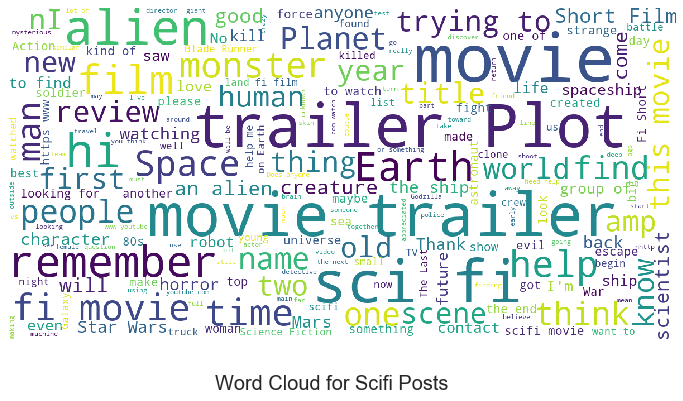

In [658]:
show_wordcloud(df_scifi['content'],'Word Cloud for Scifi Posts')


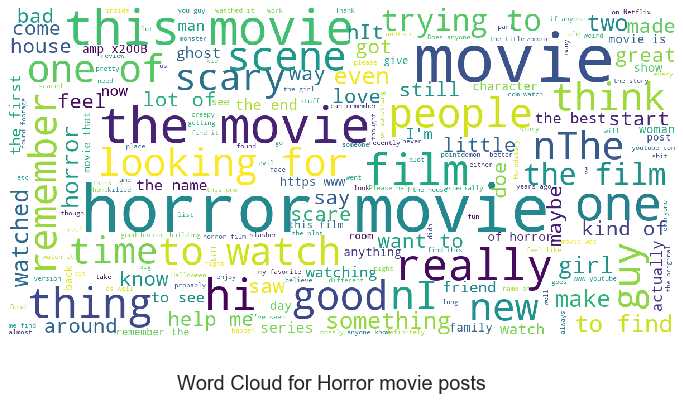

In [659]:
show_wordcloud(df_horror['content'],'Word Cloud for Horror movie posts')


Outlier Detection: Not applicable in this case as we are dealing with very large amount of text data and also, no outlier word as such discovered

### Preparation of master dataset

In [660]:

# merging title and selftext to create column 'content' to remove null values
# Merge the dtafrmaes


df_master = pd.concat([df_scifi, df_horror], ignore_index=True)
df_master = df_master[['subreddit', 'content','id']]
df_master.set_index("id", inplace=True)



In [661]:
 
df_master['is_horror'] = df_master['subreddit'].map({'scifimovies': 0, 'HorrorMovies': 1})


In [662]:
df_master.head()

,subreddit,content,is_horror
id,,,
heysxo,scifimovies,"How To Make A Monster 1958 movie trailer Plot: When a master monster make-up artist is sacked by the new bosses of American International studios, he uses his creations to exact revenge.",0
heyfue,scifimovies,"The Amazing Colossal Man (1957) movie trailer Plot: A military officer survives a nuclear blast, only to begin to uncontrollably grow into an increasingly unstable giant.",0
hes90d,scifimovies,"The Man From Planet X (1951) movie trailer Plot: As a mysterious planet hurls itself toward earth, an enigmatic extraterrestrial scout arrives on a remote Scottish island with unknown intentions.",0
heda0r,scifimovies,"Robowar 1988 movie trailer Plot: A clone/mix of PREDATOR, RAMBO, and ROBOCOP gone nuts jungle flick with an international cast, exotic locale and good electronic music.",0
hedk1c,scifimovies,"Gamera vs Viras aka Destroy All Planets 1968 movie trailer Plot: Gamera the Flying Turtle falls under the spell of evil aliens, but two children free him and he returns to fight the aliens' monster, Viras.",0


In [ ]:
save_df_to_csv(df_master,'combined')
df_master.shape

In [663]:
df_master.head()

,subreddit,content,is_horror
id,,,
heysxo,scifimovies,"How To Make A Monster 1958 movie trailer Plot: When a master monster make-up artist is sacked by the new bosses of American International studios, he uses his creations to exact revenge.",0
heyfue,scifimovies,"The Amazing Colossal Man (1957) movie trailer Plot: A military officer survives a nuclear blast, only to begin to uncontrollably grow into an increasingly unstable giant.",0
hes90d,scifimovies,"The Man From Planet X (1951) movie trailer Plot: As a mysterious planet hurls itself toward earth, an enigmatic extraterrestrial scout arrives on a remote Scottish island with unknown intentions.",0
heda0r,scifimovies,"Robowar 1988 movie trailer Plot: A clone/mix of PREDATOR, RAMBO, and ROBOCOP gone nuts jungle flick with an international cast, exotic locale and good electronic music.",0
hedk1c,scifimovies,"Gamera vs Viras aka Destroy All Planets 1968 movie trailer Plot: Gamera the Flying Turtle falls under the spell of evil aliens, but two children free him and he returns to fight the aliens' monster, Viras.",0


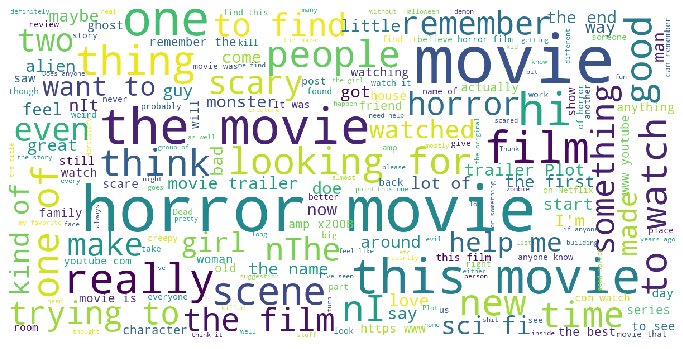

In [664]:
show_wordcloud(df_master['content'])


### Set up our data for modeling


In [665]:
X = df_master[['content']]
y = df_master['is_horror']

### Review distribution of the 2 Classes


In [666]:
y.value_counts(normalize=True)


1    0.716139
0    0.283861
Name: is_horror, dtype: float64

### Baseline Score

Our baseline score accuracy is 71.6 % for predicting a horror movie and 28.3 % for predicting a scifi movie. There is a clear imbalance in the distribution of data. The chosen subreddits had limited amount of data and as per the project scope data scraping from no other source was allowed. But different metrics can be used for such to address the issue of imbalance.

In [667]:
y.value_counts()

1    883
0    350
Name: is_horror, dtype: int64

<b>Observation:</b>
- Both classes are quite unbalanced

In [668]:
st = nltk.corpus.stopwords.words('english')
newStopWords = ['movie','movies','film', 'plot','sci','fi','https','imdb','com']
my_stop_words = text.ENGLISH_STOP_WORDS.union(newStopWords)


### Functions used in the code

In [693]:


###Functions

# Function to pre-process content before analysing
def clean(df, lemma):
    i = 0
    df_tmp = df
    while i < df_tmp.shape[0]:
        df_tmp.content[i] = BeautifulSoup(df_tmp.content[i]).get_text()  # Remove HTMLs
        df_tmp.content[i] = re.sub(r'^https:\/\/\S+(\/\S+)*(\/)?$', '',df_tmp.content[i], flags=re.MULTILINE)  # Remove URLs
        df_tmp.content[i] = re.sub("[^a-zA-Z]", " ", df_tmp.content[i])  # Remove non-letters
        # Convert to lower case, split into individual words
        df_tmp.content[i] = df_tmp.content[i].lower()
        if lemma == True:
            tokenizer = RegexpTokenizer(r'\w+')
            lemmatizer = WordNetLemmatizer()
            df_tmp.content[i] = tokenizer.tokenize(df_tmp.content[i])
            df_tmp.content[i] = [lemmatizer.lemmatize(j, pos="v") for j in df_tmp.content[i]]
            # Join the words back into one string separated by space, and return the result
            df_tmp.content[i] = (" ".join(df_tmp.content[i]))
        i += 1
        if i % 100 == 0:
            display(Markdown(f'Cleaned {i} rows out of {df_tmp.shape[0]}'))
    print(f'{df_tmp.shape[0]} rows cleaned')
    return df_tmp

 
# Function to search the best parameters
def search(vects, models, df, y, use_params):
    model_solns = {}  # Create an empty dictionary
    idx = 0  # Set model index as 0
    for v in vects:  # For each vectorizer in vects and for each model in models, perform grid search
        for m in models:
            X_train, X_test, y_train, y_test = train_test_split(
                df, y, random_state=42, stratify=y)  # Train test split and stratify by y
            idx += 1  # Inccrease the index number by 1
            # Declare vecorizer in loop as pipe_items list
            pipe_items = [v]
            pipe_items.append(m)  # Append the model to pipe_items
            [train_score, test_score, y_test, y_test_hat, best_params, f1_score] = pipeline(
                pipe_items, use_params, X_train.content, X_test.content, y_train, y_test)  # Call pipeline to perform grid search for best parameters
            model_solns[idx] = {'vectorizer': v, 'model': m, 'train_score': train_score, 'test_score': test_score,
                                'best_params': best_params, 'f1_score': f1_score}  # Add the values of grid search to model_solns dictionary
    # Display success when completed
    display(Markdown(f'<span style="color: red;"><b>COMPLETED</b></span>'))
    # Create a DataFrame from dictionary
    df_solns = pd.DataFrame(model_solns)
    # Save DataFrame as csv so we do not need to run this the next time
    df_solns.to_csv(f'./data/gridsearch.csv')
    return df_solns, X_train, X_test, y_train, train_score, test_score, y_test, y_test_hat, best_params, f1_score

# Function to search best parameters using grid search cv via pipeline
def pipeline(items, use_params, X_train, X_test, y_train, y_test):
    pipe_items = {  # Initialise vectorizers and models for our pipeline
        # Initialise CountVectorizer
        'cv': CountVectorizer(),
        # Initialise TfidfVectorizer
        'tv': TfidfVectorizer(),
        # Initialise HashingVectorizer
        'hv': HashingVectorizer(alternate_sign=True),
        'wv': Word2Vec(),
        'lr': LogisticRegression(),  # Initialise LogisticRegression
        'bnb': BernoulliNB(),  # Initialise BernoulliNB
        'mnb': MultinomialNB(),  # Initialise MultinomialNB
        'gnb': GaussianNB(),  # Initialise GaussianNB
        'knn': KNeighborsClassifier()
    }
    param_items = {  # Declare parameters for grid search
        'cv': {  # CountVectorizer parameters
            'cv__stop_words': [None, my_stop_words],
            'cv__ngram_range': [(1, 1), (1, 2)],  # ngram range from 1 to 3
            'cv__max_df': [0.95, 1.0],  # max df of 95% or 100%
            'cv__min_df': [1, 2],  # min df of 1 or 2 documents
            # max features from 1,000 to maximum
            'cv__max_features': [10000, 20000, 3000, None]
        },
        'tv': {  # TfidfVectorizer parameters
            'tv__stop_words': [None, my_stop_words],
            'tv__ngram_range': [(1, 1), (1, 2)],  # ngram range from 1 to 3
            'tv__max_df': [0.95, 1.0],  # max df of 95% or 100%
            'tv__min_df': [1, 2],  # min df of 1 or 2 documents
            # max features from 1,000 to maximum
            'tv__max_features': [10000, 20000, 3000, None]
        },
        'hv': {  # HashingVectorizer parameters
            # ngram range from 1 to 3
            'hv__ngram_range': [(1, 1), (1, 2), (1, 3)]
        },
        'wv': {

        },
        'lr': {  # LogisticRegression parameters
            'lr__C': [1, .05],  # Inverse alpha of 1 and 0.05
            'lr__penalty': ['l1', 'l2']  # L1 or L2 regularization
        },
        'bnb': {  # BernoulliNB parameters
            # alpha range from 0.0001 to 1.0
            'bnb__alpha': [0.0001, 0.01, 1.0]
        },
        'mnb': {  # MultinomialNB parameters
            # alpha range from 0.0001 to 1.0
            'mnb__alpha': [0.0001, 0.01, 1.0]
        },
        'gnb': {  # GaussianNB parameters
        },
        'knn': {
            'knn__n_neighbors': [35, 200]
        }
    }
    params = dict()  # Create the parameters for GridSearch
    if use_params:
        for i in items:  # for each vectorizer,
            for p in param_items[i]:  # for each parameter
                # set parameters for vectorizer in the dictionary
                params[p] = param_items[i][p]
    pipe_list = [(i, pipe_items[i]) for i in items]
    method = list()  # create an empty list
    for p in pipe_list:  # for each vectorizer in pipeline
        # append values to method list
        method.append(str(p[1]).split('(')[0])
    # Display vectorizer and model used for current grid search
    display(Markdown(f'<b>Using {method[0]} with {method[1]}</b>'))
    pipe = Pipeline(pipe_list)  # Create the pipeline
    # Perform grid search for the vectorizer and parameters in pipeline. Verbose set to 1 to display progress
    gs = GridSearchCV(pipe, param_grid=params,verbose=1, pre_dispatch=None, cv=2)
    # fit values of grid search onto X_train and y_train
    gs.fit(X_train, y_train)
    train_params = gs.best_params_  # Declare the best parameters for model
    train_score = gs.best_score_  # Declare training score for model
    y_test_hat = gs.predict(X_test)  # Predict target from model
    test_score = gs.score(X_test, y_test)  # Accuracy of model
    for k in train_params:  # For each parameter in grid search,
        print(f"{k}: {train_params[k]}")  # Print parameter used
    print(f'\nTrain score: {train_score}')  # Print training score
    print(f'Test score: {test_score} (Accuracy)\n')  # Print accuracy
    tn, fp, fn, tp = confusion_matrix(
        y_test, y_test_hat).ravel()  # Get the confusion matrix
    f1_score = 2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn))))
    print(f"True Negatives: {tn}")  # Predicted real news correctly
    # Predicted fake news incorrectly
    print(f"False Positives: {fp} (Type I Error)")
    # Predicted real news incorrectly
    print(f"False Negatives: {fn} (Type II Error)")
    print(f"True Positives: {tp}\n")  # Predicted fake news correctly
    # Display completed banner
    display(Markdown(f'<b>Sensitivity:</b> {tp/(tp+fn)}'))
    display(Markdown(f'<b>Miss Rate:</b> {fn/(tp+fn)}'))
    display(Markdown(f'<b>Specificity:</b> {tn/(fp+tn)}'))
    display(Markdown(f'<b>Fall Out Rate:</b> {fp/(fp+tn)}'))
    print()
    display(Markdown(f'<b>Precision:</b> {tp/(tp+fp)}'))
    display(Markdown(f'<b>False Discovery Rate:</b> {fp/(tp+fp)}'))
    display(Markdown(f'<b>Negative Predictive Value:</b> {tn/(tn+fn)}'))
    display(Markdown(f'<b>False Omission Rate:</b> {fn/(tn+fn)}'))
    print()
    display(Markdown(f'<b>Prevalence:</b> {(tp+fn)/(tp+fp+tn+fn)}'))
    display(Markdown(f'<b>Accuracy:</b> {(tp+tn)/(tp+fp+tn+fn)}'))
    print()
    display(Markdown(f'<b>Positive Likelihood Ratio:</b> {(tp/(tp+fn))/(fp/(fp+tn))}'))
    display(Markdown(f'<b>Negative Likelihood Ratio:</b> {(fn/(tp+fn))/(tn/(fp+tn))}'))
    display(Markdown(f'<b>Diagnostic Odds Ratio:</b> {((tp/(tp+fn))/(fp/(fp+tn)))/((fn/(tp+fn))/(tn/(fp+tn)))}'))
    display(Markdown(f'<b>F1 Score:</b> {2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn))))}'))
    print()
    display(Markdown(f'<span style="color: red;"><b>****Completed {method[0]} with {method[1]}****<b></span>'))
    print()
    print()
    return train_score, test_score, y_test, y_test_hat, train_params, f1_score




In [670]:
df_master.shape[0]

1233

## Run a simple CountVectorizer and explore


In [671]:
cv_simple = CountVectorizer(stop_words=set(my_stop_words),
                            binary = True,
                            ngram_range=(1,2),
                            min_df=2)
X_cv = cv_simple.fit_transform(df_master['content'])


cv_content = pd.DataFrame(X_cv.todense(), columns=cv_simple.get_feature_names())


In [672]:
# Create a data frame of the most common words 

n_words = 40
words = list(cv_content.sum().sort_values(ascending=False)[:n_words].index)
cv_content['is_horror'] = df_master['is_horror'].values
cv_content_small = cv_content.groupby('is_horror').sum()[words]
cv_content_small.T


is_horror,0,1
horror,10,482
like,33,298
just,15,251
good,14,219
watch,17,214
help,32,192
know,16,206
think,22,196
remember,30,183
ve,19,190


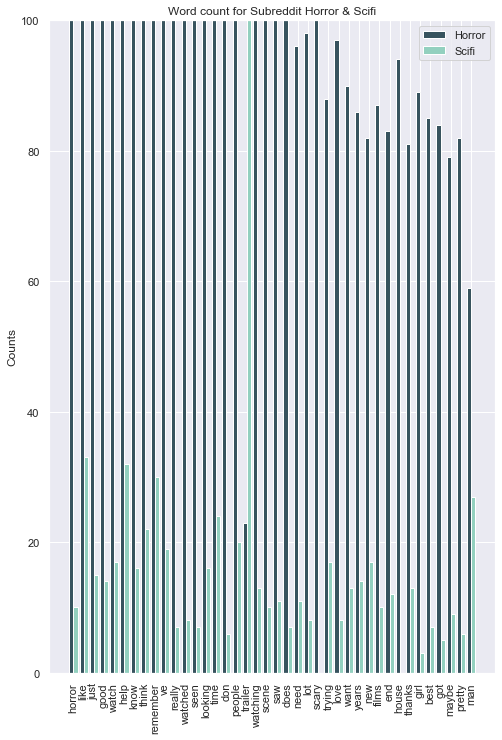

In [673]:
# Adapted from https://matplotlib.org/examples/api/barchart_demo.html

words_horror = words
words_count_horror = cv_content_small.loc[1]
words_scifi = words
words_count_scifi = cv_content_small.loc[0]
width = 0.40       # the width of the bars
ind = np.arange(n_words)

fig, ax = plt.subplots(figsize=(8, 12))
rects1 = ax.bar(ind, words_count_horror, width, color=colors[0])
rects2 = ax.bar(ind+width,words_count_scifi, width, color=colors[5])

# add some text for labels, title and axes ticks
ax.set_ylabel('Counts')
ax.set_title('Word count for Subreddit Horror & Scifi')
ax.set_xticks(ind + width / 2)
ax.set_xticklabels(words,rotation='vertical')

ax.set_ylim(0,100)

ax.legend((rects1[0], rects2[0]), ('Horror', 'Scifi'))

plt.show()

### Run a simple TfidfVectorizer and explore

In [674]:
tv_simple = TfidfVectorizer(stop_words=set(my_stop_words),
                            binary = True,
                            ngram_range=(1,2),
                            #token_pattern=r'(?u)\b\w+\b',
                            min_df=2)
X_tv = tv_simple.fit_transform(df_master['content'])

tv_words= pd.DataFrame(X_tv.todense(), columns=tv_simple.get_feature_names())


In [675]:
# Create a data frame of the most common words 

n_words = 20
words = list(tv_words.sum().sort_values(ascending=False)[:n_words].index)
tv_words['is_horror'] = df_master['is_horror'].values
tv_words_small = tv_words.groupby('is_horror').sum()[words]
tv_words_small.head().T

is_horror,0,1
horror,1.030877,33.008400
good,2.561279,19.375423
like,2.657089,19.253362
trailer,18.926271,2.461847
just,2.238582,18.550076
help,3.804222,16.295091
watch,1.696963,18.359237
know,1.446064,17.437230
seen,0.938107,16.565329
think,2.328956,15.128560


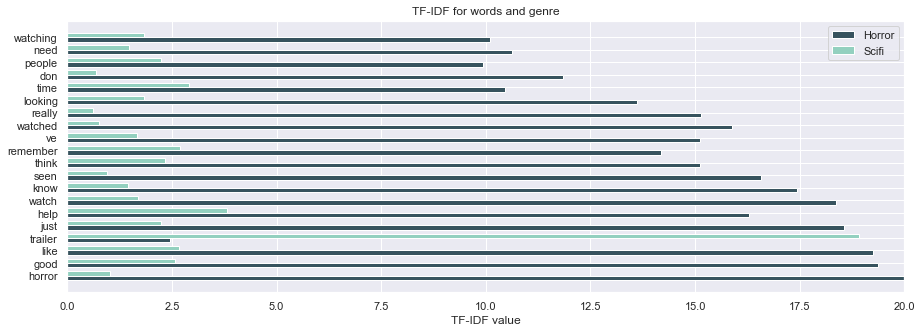

In [676]:

words_horror = words
words_count_horror = tv_words_small.loc[1]
words_scifi = words
words_count_scifi = tv_words_small.loc[0]
width = 0.35       # the width of the bars
ind = np.arange(n_words)

fig, ax = plt.subplots(figsize=(15, 5))
rects1 = ax.barh(ind, words_count_horror, width, color=colors[0])
rects2 = ax.barh(ind+width,words_count_scifi, width, color=colors[5])

# add some text for labels, title and axes ticks
ax.set_xlabel('TF-IDF value')
ax.set_title('TF-IDF for words and genre')
ax.set_yticks(ind + width / 2)
ax.set_yticklabels(words)  #,rotation='vertical')

ax.set_xlim(0,20)

ax.legend((rects1[0], rects2[0]), ('Horror', 'Scifi'))

plt.show()

<b>Observation:</b>
- 'horror','like','good' are the few top words for horror subreddits.
I will add some more generic words which may not be really helpful to classify the subreddits

In [677]:
# To remove warnings
import sys

if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")

### M_1: Model Using Cleaned Data but without Lemmatization

For our first model, we will be using raw or unprocessed data and cleaned data without lemmatization



<b>Vectorizers :</b> CountVectorizer 
<b>Models:</b> Logistic Regression 


In [681]:
# Split the target vector from the dataframe
y = df_master['is_horror']
df_master.drop(['is_horror','subreddit'], inplace=True, axis=1)
df_master.head()

,content
id,
heysxo,"How To Make A Monster 1958 movie trailer Plot: When a master monster make-up artist is sacked by the new bosses of American International studios, he uses his creations to exact revenge."
heyfue,"The Amazing Colossal Man (1957) movie trailer Plot: A military officer survives a nuclear blast, only to begin to uncontrollably grow into an increasingly unstable giant."
hes90d,"The Man From Planet X (1951) movie trailer Plot: As a mysterious planet hurls itself toward earth, an enigmatic extraterrestrial scout arrives on a remote Scottish island with unknown intentions."
heda0r,"Robowar 1988 movie trailer Plot: A clone/mix of PREDATOR, RAMBO, and ROBOCOP gone nuts jungle flick with an international cast, exotic locale and good electronic music."
hedk1c,"Gamera vs Viras aka Destroy All Planets 1968 movie trailer Plot: Gamera the Flying Turtle falls under the spell of evil aliens, but two children free him and he returns to fight the aliens' monster, Viras."


In [682]:
# Train/Test split
X_train, X_test, y_train, y_test = train_test_split(df_master, y, random_state=42, stratify=y)

In [683]:
clean(X_train,False)

Cleaned 100 rows out of 924

Cleaned 200 rows out of 924

Cleaned 300 rows out of 924

Cleaned 400 rows out of 924

Cleaned 500 rows out of 924

Cleaned 600 rows out of 924

Cleaned 700 rows out of 924

Cleaned 800 rows out of 924

Cleaned 900 rows out of 924

924 rows cleaned


,content
id,
ffnezj,what are some really good horror movies on hulu hey i only have hulu cos thats all i can afford but does anyone know some good horror movies on there thank you so much
ffmcrd,asulum tapes or sinister whats the movie tonight yeah i understand they re not the best horrors but they re all i have now i don t exactly have netflix or a wide selection poll closes in a half an hour i ll watch whatever people pick for me https www strawpoll me https www strawpoll me
gb8ioo,i made a list of movies without any violent sexual stuff here is the list d https www imdb com list ls https www imdb com list ls you can watch with your family i just felt like sharing please tell me more videos that might not be in this list so i can check them out cheers also another user also made a awesome list if you want to check d https www imdb com list ls https www imdb com list ls
fiv7va,norwegian horror movies not sure if this is the right place to post but ive been learning norwegian for just under a year and i m looking for some good movies that are in norway speak norwegian specifically very violent gory horror movies or movies about metal horror comedies nothing about the band mayhem please
g1f2k3,helping a friend figure out a movie they remember my friend messaged me trying to figure out the name of a movie they watched about years ago and it sounds interesting but nothing i can identify hey there i saw it back in the s and the plot was about these people to seemed to live in tree houses they never left but interacted by internet at the end of it there was some unseen monster that came and killed them all i remember it had a lot of green light like a dos based computer system or their web images were black and green hopefully we can crack this
ey3i21,i need some help with a haunted house movie hi pardon any mistakes about sub educate i m unaware of but this has been inching me for a few months now it s a horror movie with ghosts chasing people around this haunted house i can t remember much about it since i saw it as a kid but i remember the ending where the survivors are outside looking over the ocean at sunset or sunrise from the roof with no way down the house has a mechanical element to it but it s not ghosts it was most likely made between the s and the mid s
go74h9,dream house this seems good its abit jumpy ayit this car believe this has escaped me need some good horrors to watch goldies that i might of missed
fh5zie,i need help finding a horror movie and i think it s from the early s ok i only remember the beginning people driving on a road in the desert middle of nowhere in the evening they hit a deer then i think the dog runs off they look for it and when it comes back it s hurt dragging itself on its front legs and there might also be a scene in the same desert middle of nowhere area where a man is seen with a super injured half face does anyone knoooow or am i mixing up two movies here
h8jcq7,searching for horror movie i ve seen a horror movie many years ago and i can t find it the only thing i remember that one of the victim who survived the demon s attack was arrested for murder and his camera probably with a lot of evidence was found in his cell if anyone know this movie please let me know it s title because i wanna rewatch it after so many years because i can t remember for the whole thank you so much d


In [684]:
clean(X_test,False)

Cleaned 100 rows out of 309

Cleaned 200 rows out of 309

Cleaned 300 rows out of 309

309 rows cleaned


,content
id,
eh0ne0,should we try to bring our modest little sub back if anyone sees this chime in
adq8cp,dave bautista joins dune reboot
fepn8p,castlevania season anyone else seen it yet
fvqq8g,please help me remember what movie this is the movie came out approximately and there s a scene of a little boy toddler aged in a doorway staring down the hall his mother is at the end of the hall slightly around the corner she s trying to coax him towards her and says something like everything is okay and then a creepy hand comes from around the corner and grabs her head snatching her back behind the corner
hcxlzy,need more to watch hello lately i have been getting bored with the horror movies i ve been finding on my own i like to be utterly disturbed and psychologically upset by movies but unfortunately at the same time i am a bit of a cinema snob blood for the sake of blood doesn t always cut it some of my favorites include hereditary duh us requim for a dream not horror but terrifying somehow and so well made and the others i m all over the place with my favorites but i m just curious what you guys recommend google isn t cutting it lately thank you in advance
hdcgnt,scary movies without sex or nudity me and my parents like horror movies and we re looking for some good ones to watch they don t have an issue with violence as long as it s not torture porn but they don t want me to watch any sex scenes or stuff movies i ve watched and liked final destination it misery get out
favt60,what did you think of the movie vfw personally it s my favorite movie of so far https www youtube com watch v yussuptghzw
g3qesv,searching for a movie hi i am searching for a movie where the main charakters participate in a game show in a abandoned asylum during the challenges something goes wrong and the die if u know the name pls tell me
hei1tb,help me find this movie apologising now for how bad the details are long story short i watched a horror movie a few years back and can t recall the name it wasn t the best made movie but wasn t the worst so in the beginning of the movie you see a girl buried in the garden and her parents get her out it cuts to a new scene where she s got a new home and her parents are trying to get her to make friends she does these new friends came to her home and things get spooky now i apologise again for lack of detail here she ends up seeing little pieces of how they re gonna die in that house not like final destination though for example she stands at the top of the stairs and sees a girls body dead at the bottom and later on it happens to the same girl she falls down the stairs and breaks her neck there is a cheesy scene where two guys are fighting over a girl and they accidentally hit her can t recall if she died there or if i am forgetting more details there s two girls who killed each other at the same time one had a knife the other a gun just mentioning some deaths i recall as it may help i hope and right at the very end of this movie the same girl from the beginning who buried herself is shown in a hospital looking at a magazine and wouldn t you know it the models in that magazine are her friends and she imagined it all this whole time whilst being in the hospital since the start when she was dug up by her parents the movie mentions she buried herself a lot i ve described this to people and i confirm that it is not haunting at whaley house the wrong house or dead souls but the movie cover was similar i was young when i watched it late s early s sorry for rambling i just wanted to put down as much as i can recall


In [687]:
# Basic CountVectorizer and LogisticRegression to get a simple first model

cv_simple = CountVectorizer()
X_train_cv = cv_simple.fit_transform(X_train['content'])
X_test_cv = cv_simple.transform(X_test['content'])

print("There are {} features in the model.".format(len(cv_simple.get_feature_names())))

lr_simple = LogisticRegressionCV(cv=3)
lr_simple.fit(X_train_cv, y_train)
score_train = lr_simple.score(X_train_cv, y_train)
score_test = lr_simple.score(X_test_cv, y_test)

# There are 7616 features in the model.
##Train score: 0.9989177489177489 Test score 0.912621359223301
print("Train score: {} Test score {}".format(score_train, score_test))

There are 7616 features in the model.
Train score: 0.9989177489177489 Test score 0.912621359223301


In [688]:
# What are the words that best predict the target based on the coefficients

coef_names = cv_simple.get_feature_names()

coef_df = pd.DataFrame ({
    'coefs' : coef_names,
    'vals' : lr_simple.coef_[0]
}).set_index('coefs')

coef_df.reindex(coef_df['vals'].abs().sort_values(ascending=False).index)[:20].T

coefs,horror,guess,sci,fi,trailer,arrival,grudge,streaming,june,else,watched,thoughts,review,guys,seen,remake,watching,prometheus,scary,alien
vals,3.609238,3.03635,-2.882996,-2.882996,-2.412734,-1.818088,1.77288,1.748733,1.748314,-1.740686,1.72334,1.690128,-1.631488,1.614941,1.567212,1.556496,-1.472993,-1.428508,1.40576,-1.395936


The model appears to be slightly overfitting but has a satisfactory test score (0.912621359223301) which is above our baseline score
- words with the largest coefficients are mostly unsurprising.
- It was expected to have word 'horror' with very high coefficient 
- But it surprising to see the word 'guess' also has such a large coefficient.

High frequency words for scifi movie: sci, fi, trailer

High frequency words for horror movie: 'horror', 'guess'


<b>Second step: add in bi-grams, use a simple CountVectorizer, and model with logistic regression.</b>


In [691]:
cv_gram = CountVectorizer(ngram_range=(1,2))
X_train_cvg = cv_gram.fit_transform(X_train['content'])
X_test_cvg = cv_gram.transform(X_test['content'])

print("There are {} features in the model.".format(len(cv_gram.get_feature_names())))

lr_simple = LogisticRegressionCV(cv=3)
lr_simple.fit(X_train_cvg, y_train)
score_train = lr_simple.score(X_train_cvg, y_train)
score_test = lr_simple.score(X_test_cvg, y_test)

# There are 49826 features in the model.
#Train score: 0.9989177489177489 Test score 0.912621359223301
print("Train score: {} Test score {}".format(score_train, score_test))

There are 49826 features in the model.
Train score: 0.9989177489177489 Test score 0.912621359223301


## M_2: Model with Processed Data



In this model, we will use BeautifulSoup, Lemmatization and RegEx to clean our data. But we will not remove the Stopwords.

In [601]:
# Clean the training data and assign it to df_processed
df_processed = clean(df_master,lemma=True)

Cleaned 100 rows out of 1233

Cleaned 200 rows out of 1233

Cleaned 300 rows out of 1233

Cleaned 400 rows out of 1233

Cleaned 500 rows out of 1233

Cleaned 600 rows out of 1233

Cleaned 700 rows out of 1233

Cleaned 800 rows out of 1233

Cleaned 900 rows out of 1233

Cleaned 1000 rows out of 1233

Cleaned 1100 rows out of 1233

Cleaned 1200 rows out of 1233

1233 rows cleaned


### Create a function to run grid search on anything we might want to investigate


In [603]:
# Enter what vectorizers and classifiers we want to use and find the best.

vectorizer = ['cv','tv']
classifier = ['lr','mnb']
use_params = False

df_solns, X_train, X_test, y_train, train_score, test_score, y_test, y_test_hat, best_params, f1_score = search(vectorizer,classifier,df_master,y,use_params)

<b>Using CountVectorizer with LogisticRegression</b>

Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Train score: 0.9188311688311688
Test score: 0.912621359223301 (Accuracy)

True Negatives: 73
False Positives: 15 (Type I Error)
False Negatives: 12 (Type II Error)
True Positives: 209



[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished


<b>Sensitivity:</b> 0.9457013574660633

<b>Miss Rate:</b> 0.05429864253393665

<b>Specificity:</b> 0.8295454545454546

<b>Fall Out Rate:</b> 0.17045454545454544

<b>Precision:</b> 0.9330357142857143

<b>False Discovery Rate:</b> 0.06696428571428571

<b>Negative Predictive Value:</b> 0.8588235294117647

<b>False Omission Rate:</b> 0.1411764705882353

<b>Prevalence:</b> 0.7152103559870551

<b>Accuracy:</b> 0.912621359223301

<b>Positive Likelihood Ratio:</b> 5.5481146304675715

<b>Negative Likelihood Ratio:</b> 0.06545589784912911

<b>Diagnostic Odds Ratio:</b> 84.7611111111111

<b>F1 Score:</b> 0.9393258426966292

<span style="color: red;"><b>****Completed CountVectorizer with LogisticRegression****<b></span>

<b>Using CountVectorizer with MultinomialNB</b>

Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished



Train score: 0.8668831168831169
Test score: 0.883495145631068 (Accuracy)

True Negatives: 53
False Positives: 35 (Type I Error)
False Negatives: 1 (Type II Error)
True Positives: 220



<b>Sensitivity:</b> 0.995475113122172

<b>Miss Rate:</b> 0.004524886877828055

<b>Specificity:</b> 0.6022727272727273

<b>Fall Out Rate:</b> 0.3977272727272727

<b>Precision:</b> 0.8627450980392157

<b>False Discovery Rate:</b> 0.13725490196078433

<b>Negative Predictive Value:</b> 0.9814814814814815

<b>False Omission Rate:</b> 0.018518518518518517

<b>Prevalence:</b> 0.7152103559870551

<b>Accuracy:</b> 0.883495145631068

<b>Positive Likelihood Ratio:</b> 2.5029088558500323

<b>Negative Likelihood Ratio:</b> 0.00751301972167677

<b>Diagnostic Odds Ratio:</b> 333.1428571428571

<b>F1 Score:</b> 0.9243697478991597

<span style="color: red;"><b>****Completed CountVectorizer with MultinomialNB****<b></span>

<b>Using TfidfVectorizer with LogisticRegression</b>

Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Train score: 0.8896103896103896
Test score: 0.9061488673139159 (Accuracy)

True Negatives: 63
False Positives: 25 (Type I Error)
False Negatives: 4 (Type II Error)
True Positives: 217



[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished


<b>Sensitivity:</b> 0.9819004524886877

<b>Miss Rate:</b> 0.01809954751131222

<b>Specificity:</b> 0.7159090909090909

<b>Fall Out Rate:</b> 0.2840909090909091

<b>Precision:</b> 0.8966942148760331

<b>False Discovery Rate:</b> 0.10330578512396695

<b>Negative Predictive Value:</b> 0.9402985074626866

<b>False Omission Rate:</b> 0.05970149253731343

<b>Prevalence:</b> 0.7152103559870551

<b>Accuracy:</b> 0.9061488673139159

<b>Positive Likelihood Ratio:</b> 3.4562895927601804

<b>Negative Likelihood Ratio:</b> 0.02528190763484881

<b>Diagnostic Odds Ratio:</b> 136.70999999999998

<b>F1 Score:</b> 0.937365010799136

<span style="color: red;"><b>****Completed TfidfVectorizer with LogisticRegression****<b></span>

<b>Using TfidfVectorizer with MultinomialNB</b>

Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Train score: 0.7510822510822511
Test score: 0.7637540453074434 (Accuracy)

True Negatives: 15
False Positives: 73 (Type I Error)
False Negatives: 0 (Type II Error)
True Positives: 221



[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished


<b>Sensitivity:</b> 1.0

<b>Miss Rate:</b> 0.0

<b>Specificity:</b> 0.17045454545454544

<b>Fall Out Rate:</b> 0.8295454545454546

<b>Precision:</b> 0.7517006802721088

<b>False Discovery Rate:</b> 0.24829931972789115

<b>Negative Predictive Value:</b> 1.0

<b>False Omission Rate:</b> 0.0

<b>Prevalence:</b> 0.7152103559870551

<b>Accuracy:</b> 0.7637540453074434

<b>Positive Likelihood Ratio:</b> 1.2054794520547945

<b>Negative Likelihood Ratio:</b> 0.0

<b>Diagnostic Odds Ratio:</b> inf

<b>F1 Score:</b> 0.8582524271844659

<span style="color: red;"><b>****Completed TfidfVectorizer with MultinomialNB****<b></span>

<span style="color: red;"><b>COMPLETED</b></span>

In [604]:

# Display the best model
df_solns = df_solns.sort_values(ascending=False, by='f1_score',axis=1)
df_solns.iloc[:,0:1]

,1
vectorizer,cv
model,lr
train_score,0.918831
test_score,0.912621
best_params,{}
f1_score,0.939326


### M_3:  Final Model

From the past 2 models, we can determine that cleaned raw unprocessed data, without Lemmatization has the highest F1 Score. Now we will fit the same data, but we will introduce new parameters and find the best model. We will also add the stop words to the below models

As we have a functions genrate our scores, I would like to explore as many vectorizers and models.


In [606]:
my_stop_words

frozenset({'a',
           'about',
           'above',
           'across',
           'after',
           'afterwards',
           'again',
           'against',
           'all',
           'almost',
           'alone',
           'along',
           'already',
           'also',
           'although',
           'always',
           'am',
           'among',
           'amongst',
           'amoungst',
           'amount',
           'an',
           'and',
           'another',
           'any',
           'anyhow',
           'anyone',
           'anything',
           'anyway',
           'anywhere',
           'are',
           'around',
           'as',
           'at',
           'back',
           'be',
           'became',
           'because',
           'become',
           'becomes',
           'becoming',
           'been',
           'before',
           'beforehand',
           'behind',
           'being',
           'below',
           'beside',
           'besides'

In [607]:
# Enter what vectorizers and classifiers we want to use and find the best.

vects = ['cv','tv','hv']
models = ['lr', 'mnb','rf','svc']
use_params = True



df_solns, X_train, X_test, y_train, train_score, test_score, y_test, y_test_hat, best_params, f1_score = search(vectorizer,classifier,df_master,y,use_params)

<b>Using CountVectorizer with LogisticRegression</b>

Fitting 2 folds for each of 256 candidates, totalling 512 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 512 out of 512 | elapsed:  1.3min finished


cv__max_df: 0.95
cv__max_features: 10000
cv__min_df: 1
cv__ngram_range: (1, 1)
cv__stop_words: None
lr__C: 1
lr__penalty: l2

Train score: 0.9188311688311688
Test score: 0.912621359223301 (Accuracy)

True Negatives: 73
False Positives: 15 (Type I Error)
False Negatives: 12 (Type II Error)
True Positives: 209



<b>Sensitivity:</b> 0.9457013574660633

<b>Miss Rate:</b> 0.05429864253393665

<b>Specificity:</b> 0.8295454545454546

<b>Fall Out Rate:</b> 0.17045454545454544

<b>Precision:</b> 0.9330357142857143

<b>False Discovery Rate:</b> 0.06696428571428571

<b>Negative Predictive Value:</b> 0.8588235294117647

<b>False Omission Rate:</b> 0.1411764705882353

<b>Prevalence:</b> 0.7152103559870551

<b>Accuracy:</b> 0.912621359223301

<b>Positive Likelihood Ratio:</b> 5.5481146304675715

<b>Negative Likelihood Ratio:</b> 0.06545589784912911

<b>Diagnostic Odds Ratio:</b> 84.7611111111111

<b>F1 Score:</b> 0.9393258426966292

<span style="color: red;"><b>****Completed CountVectorizer with LogisticRegression****<b></span>

<b>Using CountVectorizer with MultinomialNB</b>

Fitting 2 folds for each of 192 candidates, totalling 384 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 384 out of 384 | elapsed:  1.5min finished


cv__max_df: 0.95
cv__max_features: 10000
cv__min_df: 2
cv__ngram_range: (1, 1)
cv__stop_words: None
mnb__alpha: 1.0

Train score: 0.8971861471861472
Test score: 0.9093851132686084 (Accuracy)

True Negatives: 62
False Positives: 26 (Type I Error)
False Negatives: 2 (Type II Error)
True Positives: 219



<b>Sensitivity:</b> 0.9909502262443439

<b>Miss Rate:</b> 0.00904977375565611

<b>Specificity:</b> 0.7045454545454546

<b>Fall Out Rate:</b> 0.29545454545454547

<b>Precision:</b> 0.8938775510204081

<b>False Discovery Rate:</b> 0.10612244897959183

<b>Negative Predictive Value:</b> 0.96875

<b>False Omission Rate:</b> 0.03125

<b>Prevalence:</b> 0.7152103559870551

<b>Accuracy:</b> 0.9093851132686084

<b>Positive Likelihood Ratio:</b> 3.3539853811347022

<b>Negative Likelihood Ratio:</b> 0.012844840169318347

<b>Diagnostic Odds Ratio:</b> 261.1153846153846

<b>F1 Score:</b> 0.9399141630901288

<span style="color: red;"><b>****Completed CountVectorizer with MultinomialNB****<b></span>

<b>Using TfidfVectorizer with LogisticRegression</b>

Fitting 2 folds for each of 256 candidates, totalling 512 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


lr__C: 1
lr__penalty: l2
tv__max_df: 0.95
tv__max_features: 10000
tv__min_df: 2
tv__ngram_range: (1, 1)
tv__stop_words: None

Train score: 0.895021645021645
Test score: 0.9029126213592233 (Accuracy)

True Negatives: 62
False Positives: 26 (Type I Error)
False Negatives: 4 (Type II Error)
True Positives: 217



[Parallel(n_jobs=1)]: Done 512 out of 512 | elapsed:  1.3min finished


<b>Sensitivity:</b> 0.9819004524886877

<b>Miss Rate:</b> 0.01809954751131222

<b>Specificity:</b> 0.7045454545454546

<b>Fall Out Rate:</b> 0.29545454545454547

<b>Precision:</b> 0.8930041152263375

<b>False Discovery Rate:</b> 0.10699588477366255

<b>Negative Predictive Value:</b> 0.9393939393939394

<b>False Omission Rate:</b> 0.06060606060606061

<b>Prevalence:</b> 0.7152103559870551

<b>Accuracy:</b> 0.9029126213592233

<b>Positive Likelihood Ratio:</b> 3.32335537765402

<b>Negative Likelihood Ratio:</b> 0.025689680338636695

<b>Diagnostic Odds Ratio:</b> 129.3653846153846

<b>F1 Score:</b> 0.9353448275862069

<span style="color: red;"><b>****Completed TfidfVectorizer with LogisticRegression****<b></span>

<b>Using TfidfVectorizer with MultinomialNB</b>

Fitting 2 folds for each of 192 candidates, totalling 384 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 384 out of 384 | elapsed:   55.2s finished


mnb__alpha: 0.01
tv__max_df: 0.95
tv__max_features: 10000
tv__min_df: 2
tv__ngram_range: (1, 2)
tv__stop_words: None

Train score: 0.8820346320346321
Test score: 0.883495145631068 (Accuracy)

True Negatives: 52
False Positives: 36 (Type I Error)
False Negatives: 0 (Type II Error)
True Positives: 221



<b>Sensitivity:</b> 1.0

<b>Miss Rate:</b> 0.0

<b>Specificity:</b> 0.5909090909090909

<b>Fall Out Rate:</b> 0.4090909090909091

<b>Precision:</b> 0.8599221789883269

<b>False Discovery Rate:</b> 0.14007782101167315

<b>Negative Predictive Value:</b> 1.0

<b>False Omission Rate:</b> 0.0

<b>Prevalence:</b> 0.7152103559870551

<b>Accuracy:</b> 0.883495145631068

<b>Positive Likelihood Ratio:</b> 2.444444444444444

<b>Negative Likelihood Ratio:</b> 0.0

<b>Diagnostic Odds Ratio:</b> inf

<b>F1 Score:</b> 0.9246861924686193

<span style="color: red;"><b>****Completed TfidfVectorizer with MultinomialNB****<b></span>

<span style="color: red;"><b>COMPLETED</b></span>

In [608]:

# Display the best model
df_solns = df_solns.sort_values(ascending=False, by='f1_score',axis=1)
df_solns.iloc[:,0:1]

,2
vectorizer,cv
model,mnb
train_score,0.897186
test_score,0.909385
best_params,"{'cv__max_df': 0.95, 'cv__max_features': 10000, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': None, 'mnb__alpha': 1.0}"
f1_score,0.939914


In [610]:
# Saving our best parameters for later use
# best_alpha = 1.0
# best_max_df = 0.95
# best_max_features = None
# best_min_df = 1
# best_ngram_range = (1,2)
# best_stop = None
# best_classifier = 'mnb'
# best_vectorizer = 'cv'
# best f1_score

## Evaluation

<b>Metric for  the best scores(train,test and f1) along with the vectorizer and model used</b>

In [611]:

df_solns.sort_values(ascending=False, by='f1_score',axis=1)

,1,2,3,4
vectorizer,cv,cv,tv,tv
model,lr,mnb,lr,mnb
train_score,0.918831,0.897186,0.895022,0.882035
test_score,0.912621,0.909385,0.902913,0.883495
best_params,"{'cv__max_df': 0.95, 'cv__max_features': 10000, 'cv__min_df': 1, 'cv__ngram_range': (1, 1), 'cv__stop_words': None, 'lr__C': 1, 'lr__penalty': 'l2'}","{'cv__max_df': 0.95, 'cv__max_features': 10000, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': None, 'mnb__alpha': 1.0}","{'lr__C': 1, 'lr__penalty': 'l2', 'tv__max_df': 0.95, 'tv__max_features': 10000, 'tv__min_df': 2, 'tv__ngram_range': (1, 1), 'tv__stop_words': None}","{'mnb__alpha': 0.01, 'tv__max_df': 0.95, 'tv__max_features': 10000, 'tv__min_df': 2, 'tv__ngram_range': (1, 2), 'tv__stop_words': None}"
f1_score,0.939326,0.939914,0.935345,0.924686


In [612]:
df_solns.loc[['vectorizer','model','train_score','test_score','best_params'],:]


,2,1,3,4
vectorizer,cv,cv,tv,tv
model,mnb,lr,lr,mnb
train_score,0.897186,0.918831,0.895022,0.882035
test_score,0.909385,0.912621,0.902913,0.883495
best_params,"{'cv__max_df': 0.95, 'cv__max_features': 10000, 'cv__min_df': 2, 'cv__ngram_range': (1, 1), 'cv__stop_words': None, 'mnb__alpha': 1.0}","{'cv__max_df': 0.95, 'cv__max_features': 10000, 'cv__min_df': 1, 'cv__ngram_range': (1, 1), 'cv__stop_words': None, 'lr__C': 1, 'lr__penalty': 'l2'}","{'lr__C': 1, 'lr__penalty': 'l2', 'tv__max_df': 0.95, 'tv__max_features': 10000, 'tv__min_df': 2, 'tv__ngram_range': (1, 1), 'tv__stop_words': None}","{'mnb__alpha': 0.01, 'tv__max_df': 0.95, 'tv__max_features': 10000, 'tv__min_df': 2, 'tv__ngram_range': (1, 2), 'tv__stop_words': None}"


In [ ]:
df_solns.loc[:,2]

In [ ]:
df_solns.head()

In [ ]:
# Let's look at the parameters of one solution
df_solns.loc['best_params',2]

In [ ]:
# Average the y_test_hat vectors to see if we can improve the score
y_test_hat_agg = sum(df_solns.loc['y_test_hat',:])
y_test_hat = np.round(y_test_hat_agg/df_solns.shape[1])
print("The accuracy score of the average test solutions is {:.2f}%.".format(accuracy_score(y_test,y_test_hat)*100))

In [632]:
# ### Best Model Results

# cv__max_df: 0.95
# cv__max_features: 10000
# cv__min_df: 2
# cv__ngram_range: (1, 1)
# cv__stop_words: None
# mnb__alpha: 1.0

# Train score: 0.8971861471861472
# Test score: 0.9093851132686084 (Accuracy)

# True Negatives: 62
# False Positives: 26 (Type I Error)
# False Negatives: 2 (Type II Error)
# True Positives: 219

# Sensitivity: 0.9909502262443439

# Miss Rate: 0.00904977375565611

# Specificity: 0.7045454545454546

# Fall Out Rate: 0.29545454545454547


# Precision: 0.8938775510204081

# False Discovery Rate: 0.10612244897959183

# Negative Predictive Value: 0.96875

# False Omission Rate: 0.03125


# Prevalence: 0.7152103559870551

# Accuracy: 0.9093851132686084


# Positive Likelihood Ratio: 3.3539853811347022

# Negative Likelihood Ratio: 0.012844840169318347

# Diagnostic Odds Ratio: 261.1153846153846

# F1 Score: 0.9399141630901288



Let us consider the confusion matrix of our model

|            | Predicted No     | Predicted Yes    | 0.71  prevalence         | .90 accuracy          |
|------------|-------------------|------------------|--------------------------|-------------------------|
| Actual No  | TN= 62            | FP= 26 (type 1)          | precision=.89            | false discovery=.10    |
| Actual Yes | FN=2  (Type 2)             | TP= 219             | false omission=.03   | negative predictive=.96     |
|            |   sensitivity=.99| fall out rate=0.29    |  positive likelihood=3.35 | diagnostic odds |
|            | miss rate=.009         |  specificity=.70 |  negative likelihood=0.01|  F1 score= .93          |

Our current data is quiet imbalaced with 71% horror movies data and 28% scifi movie data.
F1 Score is needed when you want to seek a balance between Precision and Recall. Accuracy can be largely contributed by a large number of True Negatives which in most business circumstances, we do not focus on much whereas False Negative and False Positive usually has business costs (tangible & intangible) thus F1 Score might be a better measure to use if we need to seek a balance between Precision and Recall AND there is an uneven class distribution (large number of Actual Negatives). 

 Both Logistic Regression and Naïve Bayes’s f1 score are relatively close (0.939326 vs 0.934), thus it depends on which trade-off we want in our model (high Precision/low Recall or low Precision/high Recall).
 

Let us display which of the content we predicted correctly

In [613]:

X_test['genre'] = y_test.values
X_test['pred_horror'] = y_test_hat
X_test_true = X_test[X_test["genre"] == X_test['pred_horror']]
X_test_false = X_test[X_test["genre"] != X_test['pred_horror']]

In [614]:
X_test_true.shape


(273, 5)

In [ ]:
X_test_false.shape

In [615]:
X_test_false

,subreddit,content,is_horror,genre,pred_horror
id,,,,,
adq8cp,scifimovies,dave bautista join dune reboot,0,0,1
6jfzql,scifimovies,the gary cannavo collection of battlestar galactica and buck rogers film miniatures for sale on ebay r bsg,0,0,1
bfhysd,scifimovies,help find a film i watch in the s a sci fi film about a man that be make with part from or some other number other humans his skin look like it be sew together from different color skin patch even one of his finger have a paint nail like maybe it be cut from a woman and sew on him i think he be make in a lab to be a weapon but get out in the end with the help of a female scientist any ideas,0,0,1
3z2lb2,scifimovies,s s movie end in an airplane graveyard try to track down a movie i remember rent vhs as a kid probably late s could have be early s center around one man a citizen in a stratify society in wartime he get trick into run some black ops break into a secure build to get some data or something he finally manage to escape to enemy territory and it s an abandon airstrip with inoperable plan decay on the tarmac he s greet by his handler and learn the truth the war have be over for a long time but the society he flee have come to depend on the state of perpetual warfare so the myth persist any ideas thank,0,0,1
6nwdw8,scifimovies,anomaly,0,0,1
8aunpg,scifimovies,quiet place silently part of cloverfield universe,0,0,1
ab1hyd,scifimovies,look for a movie i vaguely remember a move as a child where inmates where in a prison and they have neck implant i think and they have like line on the grind and when they would get close to the line they would hear a ring sound and if they go to far the implant would explode i know it s not a lot of info to go off but i can not find this movie at all,0,0,1
bm1dl4,scifimovies,what be it hi all i be want to ask a strange question i be do a video essay on the sub genre ecohorror and how its become more and more popular more specifically i want to capture clip from multiple horror film of the character say what be it i think it would be easy as however use the quote database and type in what be it result in almost every film that have what in it so can some of you please tell me what film have that classic quote of what be it or anything similar i e in alien ripley say what kind of thing and in cabin in the woods one character say what be that thing so yeah if any of you have any other suggestions please go ahead thank,0,0,1
1ir2qa,scifimovies,district creator neill blomkamp have start write district,0,0,1


- It can be observed that the above falsely predicted scifi movie posts are very descriptive

### Examine unigrams of the titles of incorrect predictions.


In [616]:
cv_simple = CountVectorizer(stop_words='english')
X_test_cv = cv_simple.fit_transform(X_test_false['content'])
cv_test = pd.DataFrame(X_test_cv.todense(), columns=cv_simple.get_feature_names())

In [618]:
X_test_false.columns

Index(['subreddit', 'content', 'is_horror', 'genre', 'pred_horror'], dtype='object')

In [619]:
# Create a data frame of the most common words 
n_words = 40
words = list(cv_test.sum().sort_values(ascending=False)[:n_words].index)
print(words)

cv_test['genre'] = X_test_false['is_horror'].values
cv_test_small = cv_test.groupby('genre').sum()[words]

['movie', 'remember', 'film', 'like', 'think', 'com', 'look', 'help', 'end', 'alien', 'character', 'trailer', 'want', 'watch', 'ideas', 'thing', 'fi', 'thank', 'universe', 'https', 'kill', 'sci', 'www', 'man', 'title', 'detective', 'people', 'say', 'scene', 'scifi', 'blobfest', 'ship', 'try', 'line', 'vaguely', 'head', 'hot', 'london', 'imdb', 'interview']


In [620]:
X_test_false


,subreddit,content,is_horror,genre,pred_horror
id,,,,,
adq8cp,scifimovies,dave bautista join dune reboot,0,0,1
6jfzql,scifimovies,the gary cannavo collection of battlestar galactica and buck rogers film miniatures for sale on ebay r bsg,0,0,1
bfhysd,scifimovies,help find a film i watch in the s a sci fi film about a man that be make with part from or some other number other humans his skin look like it be sew together from different color skin patch even one of his finger have a paint nail like maybe it be cut from a woman and sew on him i think he be make in a lab to be a weapon but get out in the end with the help of a female scientist any ideas,0,0,1
3z2lb2,scifimovies,s s movie end in an airplane graveyard try to track down a movie i remember rent vhs as a kid probably late s could have be early s center around one man a citizen in a stratify society in wartime he get trick into run some black ops break into a secure build to get some data or something he finally manage to escape to enemy territory and it s an abandon airstrip with inoperable plan decay on the tarmac he s greet by his handler and learn the truth the war have be over for a long time but the society he flee have come to depend on the state of perpetual warfare so the myth persist any ideas thank,0,0,1
6nwdw8,scifimovies,anomaly,0,0,1
8aunpg,scifimovies,quiet place silently part of cloverfield universe,0,0,1
ab1hyd,scifimovies,look for a movie i vaguely remember a move as a child where inmates where in a prison and they have neck implant i think and they have like line on the grind and when they would get close to the line they would hear a ring sound and if they go to far the implant would explode i know it s not a lot of info to go off but i can not find this movie at all,0,0,1
bm1dl4,scifimovies,what be it hi all i be want to ask a strange question i be do a video essay on the sub genre ecohorror and how its become more and more popular more specifically i want to capture clip from multiple horror film of the character say what be it i think it would be easy as however use the quote database and type in what be it result in almost every film that have what in it so can some of you please tell me what film have that classic quote of what be it or anything similar i e in alien ripley say what kind of thing and in cabin in the woods one character say what be that thing so yeah if any of you have any other suggestions please go ahead thank,0,0,1
1ir2qa,scifimovies,district creator neill blomkamp have start write district,0,0,1


In [628]:
len(y_train)

924

In [629]:
columns = [c for c in cv_test_small.columns if c in cv_content.columns]
cv_content = cv_content[columns]
cv_content['genre'] = y_train
cv_content_small = cv_content.groupby('genre').sum()



In [630]:
columns = [c for c in cv_content.columns if c in cv_test_small.columns]
cv_test_small = cv_test_small[columns]

cv_merge = pd.concat([cv_content_small, cv_test_small],keys=['train', 'incorrect'], sort=True)
cv_merge.head()

,,alien,character,detective,end,head,help,hot,ideas,interview,kill,like,line,london,look,man,people,remember,say,scene,scifi,ship,thank,thing,think,title,trailer,try,universe,vaguely,want,watch,www
,genre,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
incorrect,0.0,5,5,3,5,3,6,3,5,3,4,10,3,3,6,4,3,13,3,3,3,3,4,5,8,3,5,3,4,3,5,5,4


### Conclusions 

- Looking at the scores it can be concluded that the model was successfully trained to classify the movie genre
- Both Naive Bayes and Logistic Regression are used for classification problems.
- Both Logistic Regression and Naïve Bayes’s f1 score are relatively close (0.939326 vs 0.934), thus it depends on which trade-off we want in our model (high Precision/low Recall or low Precision/high Recall). 
- We have chosen Naïve Bayes’s  which has lower precision and higher Recall.  
- Naïve Bayes’s has a higher Recall of 0.99 (recall means that an algorithm returned most of the relevant results) 

### Recommendations


- Though the model works well for the current data size and imbalace, it will be definitely more emhance the classification process 
if the sample size is increased by scraping more content (from a different platform)

- Future implementation to create a multi-genre classification should be considered as the binary classifcation model appears to have a good score 

- Train the model with multiple target variables

### Takeaways & Improvements

- Model accurately predicts subreddit source
- Change the source of data to collect more data
- Horror subreddit is less descriptive than Sci-fi 
(dataset is key)
- To ensure proportion of scraped data is uniform